<p style="font-size:32px;font-weight:bold">BBC Sound Effects Sound Clip Generation</p>

In [6]:
%run '/Users/edward/Documents/Scripts/Python/init_py.py'  #macosx
# exec(open("D:/Edward/Documents/Assignments/Scripts/Python/init_py.py").read())
addpythonpkg('ReadNWrite')
addpythonpkg('generic')
from MATLAB import *
import os
import matplotlib.pyplot as plt
plt.style.use('dark_background')
import seaborn as sns
import re
import numpy as np
from scipy import signal
from IPython import display
import time
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from pdb import set_trace

jupyter mode


# Preliminary data cleaning

## Keep only the labeled data for now

In [5]:
df = pd.read_csv('./BBCSoundEffects.csv')
df = df.loc[~df['category'].isnull(), :]
df.to_csv('./BBCSoundEffect_labeld.csv', index=False)
df.head()

,location,description,secs,category,CDNumber,CDName,tracknum
0,07076051.wav,Two-stroke petrol engine driving small elevato...,194,Engines: Petrol,EC117D,Diesel & Petrol Engines,4
1,07076050.wav,"Single-cylinder Petter engine, start, run stop...",194,Engines: Diesel,EC117D,Diesel & Petrol Engines,1
2,07076049.wav,"Start, constant run with engine driving small ...",200,Engines: Petrol,EC117D,Diesel & Petrol Engines,3
3,07076048.wav,"Two false starts, constant run, stop. (2 1/4 h...",195,Engines: Petrol,EC117D,Diesel & Petrol Engines,2
4,07076047.wav,An 8 mm projector running at 24 f.p.s.,117,Cine Projectors,EC6C1,Cameras,4


## Getting animal sound

In [24]:
Summary.shape

(1191, 8)

In [ ]:
df = pd.read_csv('./BBCSoundEffect_labeld.csv')
df['SimpleCategory'] = df['category'].apply(lambda x: x.split(":")[0].strip())
gp = df.groupby(by=['SimpleCategory', 'CDName'], as_index=False, sort=True)
Summary = gp.count()
Summary2 = gp.sum()
Summary['secs'] = Summary2['secs']
Summary = Summary.sort_values('secs', ascending=False)
Summary

# Text Clustering the descriptions

In [6]:
import string
import collections

import nltk
nltk.data.path.append("/Volumes/SD/nltk_data")
from nltk import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk.corpus import wordnet as wn
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
# from gensim.models import Word2Vec
 
from pprint import pprint
 
def process_text(text, stem=True, stop_words=None, lower=False, pos=None):
    """ Tokenize text and stem words removing punctuation """
    text = text.translate(str.maketrans('','',string.punctuation))
    tokens = word_tokenize(text)
    
    if stop_words is not None:
        tokens = [w for w in tokens if not w in stop_words]
        
    if lower:
        tokens = [w.lower() for w in tokens]
        
    if pos is not None: # checking part of speech
        for i, w in enumerate(tokens):
            tmp_pos = set([k.pos() for k in wn.synsets(w)])
            if not tmp_pos or not tmp_pos <= pos:
                tokens[i] = None
        tokens = [w for w in tokens if w is not None] # remove None
 
    if stem:
        stemmer = PorterStemmer()
        tokens = [stemmer.stem(t) for t in tokens]
 
    return tokens
 
def cluster_texts(texts, clusters=3):
    """ Transform texts to Tf-Idf coordinates and cluster texts using K-Means """
    vectorizer = TfidfVectorizer(tokenizer=process_text,
                                 stop_words=stopwords.words('english'),
                                 lowercase=True)

    text_model = vectorizer.fit_transform(texts)

    km_model = KMeans(n_clusters=clusters, random_state=42)
    km_model.fit(text_model)
 
    clustering = collections.defaultdict(list)
 
    for idx, label in enumerate(km_model.labels_):
        clustering[label].append(idx) #return the index
 
    return text_model, clustering

df = pd.read_csv('./BBCSoundEffects.csv')
articles = df['description'].tolist()
tfidf_model, clusters = cluster_texts(articles, 7)

# Relabel the data
df['clusterLabel'] = np.nan
for k in clusters.keys():
    df.loc[clusters[k], 'clusterLabel'] = k

X = tfidf_model.todense()

#pprint(dict(clusters))

In [7]:
# What is the topic of the cluster
from nltk.corpus import wordnet as wn
def get_key_word(index = 0, show_df=False):
    df_sub11 = df.loc[df['clusterLabel']==index,['description', 'category', 'CDName']]
    if show_df:
        display.display(df_sub11)
    A = df_sub11.drop_duplicates().dropna().values.flatten()
    B = [process_text(a) for a in A]
    B = flat_list = [item for sublist in B for item in sublist]
    fdist = nltk.FreqDist(B)
    return fdist.most_common(10)

nouns = wn.all_synsets('n')
num_cat = len(df['clusterLabel'].unique())
key_words = [[]] * num_cat
for i in range(num_cat):
    key_word = get_key_word(i, False)
    print(key_word)
    key_words[i] = key_word[0][0]
    #word_list = [kk for kk, cc in key_word]
    #wn.synsets(w)[0].pos()
    print('=================================')

[('and', 1059), ('with', 958), ('2', 826), ('atmospher', 791), ('in', 737), ('crowd', 573), ('of', 507), ('comedi', 498), ('1', 498), ('reprocess', 483)]
[('aircraft', 445), ('engin', 427), ('exterior', 280), ('start', 268), ('helicopt', 236), ('stop', 182), ('and', 168), ('run', 159), ('off', 143), ('interior', 136)]
[('door', 245), ('open', 132), ('close', 120), ('interior', 102), ('and', 78), ('exterior', 45), ('car', 43), ('hous', 38), ('gate', 31), ('lift', 30)]
[('clock', 25), ('strike', 11), ('bell', 10), ('12', 9), ('time', 8), ('grandfath', 6), ('church', 3), ('cuckoo', 2), ('bracket', 2), ('with', 2)]
[('train', 512), ('steam', 176), ('station', 104), ('exterior', 78), ('diesel', 72), ('with', 58), ('locomot', 54), ('interior', 53), ('suburban', 45), ('pass', 44)]
[('footstep', 396), ('1', 239), ('reprocess', 198), ('2', 196), ('stop', 137), ('and', 136), ('male', 123), ('femal', 75), ('stair', 72), ('man', 71)]
[('car', 1167), ('motor', 471), ('ford', 453), ('interior', 409)

## PCA of clusters

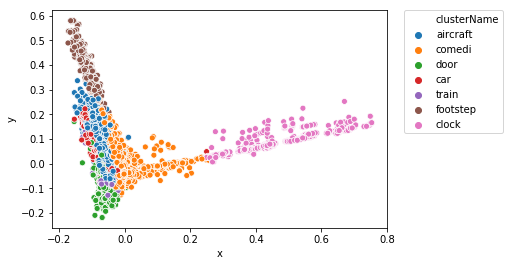

In [8]:
from sklearn.decomposition import PCA
key_words[0] = 'comedi'
if True:
    pca = PCA(n_components=2).fit(X)
    data2D = pca.transform(X)
if True:
    labels = key_words
    df['clusterName'] = np.nan
    for n, l in enumerate(labels):
        df.loc[df['clusterLabel']==n, 'clusterName'] = l

    df_plot = df.copy()
    df_plot['x'] = data2D[:,0]
    df_plot['y'] = data2D[:,1]

sns.scatterplot(x='x', y='y', hue='clusterName', data=df_plot)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.gcf().savefig('PCA_clustering.png', bbox_inches='tight', dpi=300)
plt.show()


In [9]:
df.to_csv('./BBC_Sound_Effect_clustered.csv', index=False)
np.savez_compressed('./clustering.npz', tfidf_model=tfidf_model, clusters=clusters)

In [10]:
df.head()

,location,description,secs,category,CDNumber,CDName,tracknum,clusterLabel,clusterName
0,07076051.wav,Two-stroke petrol engine driving small elevato...,194,Engines: Petrol,EC117D,Diesel & Petrol Engines,4,1.0,aircraft
1,07076050.wav,"Single-cylinder Petter engine, start, run stop...",194,Engines: Diesel,EC117D,Diesel & Petrol Engines,1,1.0,aircraft
2,07076049.wav,"Start, constant run with engine driving small ...",200,Engines: Petrol,EC117D,Diesel & Petrol Engines,3,1.0,aircraft
3,07076048.wav,"Two false starts, constant run, stop. (2 1/4 h...",195,Engines: Petrol,EC117D,Diesel & Petrol Engines,2,1.0,aircraft
4,07076047.wav,An 8 mm projector running at 24 f.p.s.,117,Cine Projectors,EC6C1,Cameras,4,0.0,comedi


## TSNE

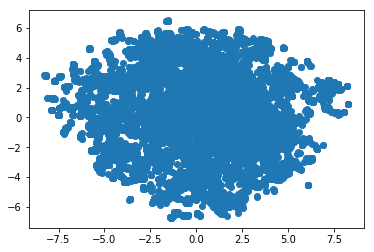

In [6]:
#from sklearn.manifold import TSNE
from MulticoreTSNE import MulticoreTSNE as TSNE
tsne = TSNE(n_jobs=4, n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.show()

# Download some data from the cluster

In [11]:
df = pd.read_csv('./BBC_Sound_Effect_clustered.csv')
gp = df.groupby(by=['clusterLabel', 'clusterName'], sort=True, as_index=False)
Summary = gp.count()
Summary2 = gp.sum()
Summary['secs'] = Summary2['secs']
Summary

,clusterLabel,clusterName,location,description,secs,category,CDNumber,CDName,tracknum
0,0.0,comedi,10686,10686,1317537,4886,10686,10283,10686
1,1.0,aircraft,1963,1963,229096,631,1963,1865,1963
2,2.0,door,606,606,14245,144,606,460,606
3,3.0,clock,728,728,24807,9,728,689,728
4,4.0,train,545,545,61583,212,545,533,545
5,5.0,footstep,581,581,17728,204,581,579,581
6,6.0,car,902,902,64328,462,902,896,902


In [12]:
df2 = df.sort_values(by=['clusterLabel'])
df2 = df2.loc[np.logical_or(df['clusterLabel']==3, df['clusterLabel']==5),:]

df2.to_csv('./clock_footstep_sorted.csv', index=False)

### Download the sound data to be explored

In [13]:
import urllib3
import shutil
import time
url_format = 'http://bbcsfx.acropolis.org.uk/assets/{}'
path_format = './wav/{}'
http = urllib3.PoolManager()
def download_file(url, path):
    if not os.path.isfile(path): # not already downloaded
        with http.request('GET', url, preload_content=False) as r, open(path, 'wb') as out_file:       
            shutil.copyfileobj(r, out_file)
df2 = df2.reset_index()
num_downloads = df2.shape[0]
printProgressBar(0,num_downloads,prefix='Progress:',suffix='Complete',length=50,mode="counts")
for i in df2.index:
    printProgressBar(i+1,num_downloads,prefix='Progress:',suffix='Complete',length=50,mode="counts")
    url = url_format.format(df2.loc[i, 'location'])
    path = path_format.format(df2.loc[i, 'location'])
    if os.path.isfile(path):
        time.sleep(0.001)
        continue # skip ones already downloaded
    download_file(url, path)


Progress:  |██████████████████████████████████████████████████| 1309 / 1309 Complete
ended


# Spectrogram

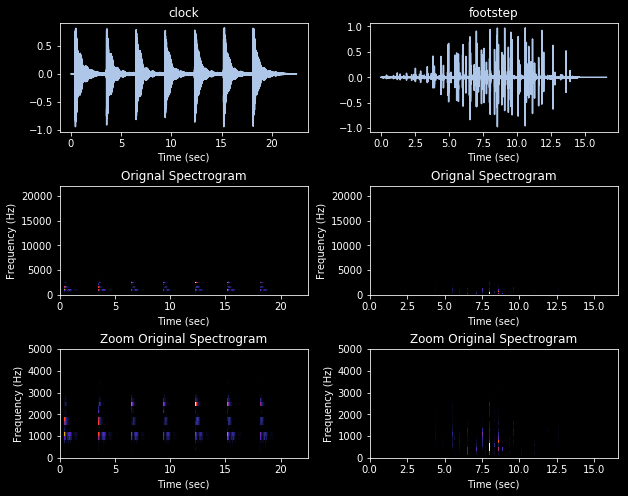

In [140]:
# Spectrogram

import librosa
import audioread

def make_spectrogram(wav_files, labels=['clock', 'footstep'], sr=44100):
    fig, ax = plt.subplots(3, 2)
    for i, wav in enumerate(wav_files):
        current_path = "./wav/{}".format(wav)
        tmp = audioread.audio_open(current_path) # ge tthe sample rate
        data_out, _ = librosa.load(current_path, sr=tmp.samplerate, dtype=np.float32)
        
        cmap = 'CMRmap'#'nipy_spectral'
        ax[0,i].plot(np.linspace(0, len(data_out)/sr,len(data_out)), data_out, c=(174/255, 199/255, 232/255))
        ax[0,i].set_title(labels[i])
        
        frequencies, times, spectrogram = signal.spectrogram(data_out, sr)

        ax[1,i].pcolormesh(times, frequencies, spectrogram, cmap=cmap)
        ax[1,i].set_title('Orignal Spectrogram')

        ax[2,i].pcolormesh(times, frequencies, spectrogram, cmap=cmap)
        ax[2,i].set_ylim(0, 5000)
        ax[2,i].set_title('Zoom Original Spectrogram')
    
    [a.set_xlabel('Time (sec)') for a in ax.flatten()]
    [a.set_ylabel('Frequency (Hz)') for a in ax[1:,:].flatten()]

    fig.subplots_adjust(wspace=0.25, hspace=0.5)
    fig.set_size_inches(10,8)
    return fig
    

clock = '07016099.wav'
footstep = '07004099.wav'

fig = make_spectrogram([clock, footstep])
fig.savefig('./Example_audio_spectrogram.png')


# Periodicity of the sounds

## Audio Segmentation

In [128]:
from auditok.cmdline import file_to_audio_source, seconds_to_str_fromatter, TokenizerWorker, LogWorker
from auditok.core import StreamTokenizer
from auditok.io import PyAudioSource, BufferAudioSource, StdinAudioSource, player_for
from auditok.util import ADSFactory, AudioEnergyValidator
import logging
import librosa
import audioread

def audio_segmentation(wavefile, analysis_window=0.01, max_time=None, energy_threshold=55, min_duration=0.2,
                       max_duration=5, max_silence=0.3, quiet=True, printf="{id} {start} {end}", 
                       debug=False, time_format='%S', drop_trailing_silence=False):
    # load the data
    asource = file_to_audio_source(filename=wavefile, uc=1)

    # Logging for segmentation
    LOGGER_NAME = "AUDITOK_LOGGER"
    logger = logging.getLogger(LOGGER_NAME)
    logger.setLevel(logging.DEBUG)
    handler = logging.StreamHandler(sys.stdout)
    handler.setLevel(logging.CRITICAL)
    logger.addHandler(handler)

    record = True

    # Dropping trailing tokenizer
    mode = StreamTokenizer.DROP_TRAILING_SILENCE if drop_trailing_silence else 0
    ads = ADSFactory.ads(audio_source=asource, block_dur=analysis_window, max_time=max_time,
                         record=record)
    validator = AudioEnergyValidator(sample_width=asource.get_sample_width(), energy_threshold=energy_threshold)


    # Segmentation parameters
    analysis_window_per_second = 1. / analysis_window
    tokenizer = StreamTokenizer(validator=validator, min_length=min_duration * analysis_window_per_second,
                                max_length=int(max_duration * analysis_window_per_second),
                                max_continuous_silence=max_silence * analysis_window_per_second,
                                mode = mode)

    observers = []
    tokenizer_worker = None

    oformat = printf.replace("\\n", "\n").replace("\\t", "\t").replace("\\r", "\r")
    converter = seconds_to_str_fromatter(time_format)
    log_worker = LogWorker(print_detections = not quiet, output_format=oformat,
                                       time_formatter=converter, logger=logger, debug=debug)
    observers.append(log_worker)

    # Do the segmentation
    tokenizer_worker = TokenizerWorker(ads, tokenizer, analysis_window, observers)

    # start observer threads
    for obs in observers:
        obs.start()
    # start tokenization thread
    tokenizer_worker.start()

    time.sleep(1) # wait a little

    tokenizer_worker = None
    
    return log_worker.detections


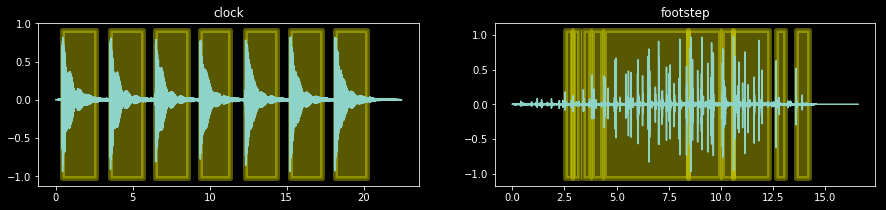

In [301]:
clock = '07016099.wav'
footstep = '07004099.wav'


# Plot
plt.style.use('dark_background')
fig, ax = plt.subplots(1, 2)
titles = ['clock', 'footstep']
energy_threshold=[55, 55]

for i, w in enumerate([clock, footstep]):
    current_path = "./wav/{}".format(w)
    # Segment
    detections = audio_segmentation(current_path, energy_threshold=energy_threshold[i], max_duration=4)
    # Plot
    tmp = audioread.audio_open(current_path) # get tthe sample rate
    sr = tmp.samplerate
    data_out, _ = librosa.load(current_path, sr=sr, dtype=np.float32)
    time_vec = np.linspace(0, len(data_out)/sr,len(data_out))
    ax[i].plot(time_vec, data_out)

    ylevel = ax[i].get_ylim()
    for _, _, _, start_time, end_time in detections:
        ax[i].fill_betweenx(ylevel, start_time, end_time, alpha=0.35, color='yellow', edgecolor='w', lw=5)
        
    ax[i].set_title(titles[i])
        
fig.set_size_inches(15, 3)

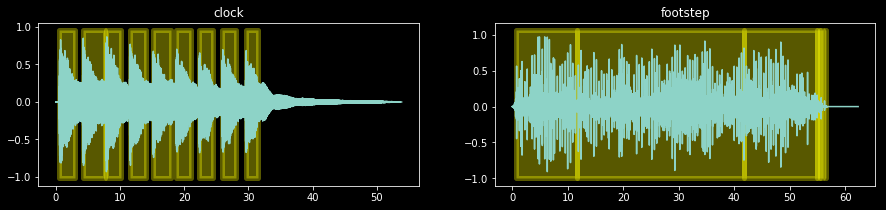

In [338]:
clock = '07016230.wav'
footstep = '07064103.wav'


# Plot
plt.style.use('dark_background')
fig, ax = plt.subplots(1, 2)
titles = ['clock', 'footstep']
energy_threshold=[72, 55]

for i, w in enumerate([clock, footstep]):
    current_path = "./wav/{}".format(w)
    # Segment
    detections = audio_segmentation(current_path, energy_threshold=energy_threshold[i], max_duration=30)
    # Plot
    tmp = audioread.audio_open(current_path) # get tthe sample rate
    sr = tmp.samplerate
    data_out, _ = librosa.load(current_path, sr=sr, dtype=np.float32)
    time_vec = np.linspace(0, len(data_out)/sr,len(data_out))
    ax[i].plot(time_vec, data_out)

    ylevel = ax[i].get_ylim()
    for _, _, _, start_time, end_time in detections:
        ax[i].fill_betweenx(ylevel, start_time, end_time, alpha=0.35, color='yellow', edgecolor='w', lw=5)
        
    ax[i].set_title(titles[i])
        
fig.set_size_inches(15, 3)

In [334]:
display.Audio('./wav/{}'.format(clock))

In [337]:
df = pd.read_csv('./clock_footstep_sorted.csv')
num_data = df.shape[0]
df_segment = pd.DataFrame({"location":[], "segment_num":[], "start":[], "end":[], 
                           "start_time":[], "end_time":[], "duration":[], "num_of_segments":[]})
printProgressBar(0,num_data,prefix='Progress:',suffix='Complete',length=50,mode="counts")
for i in df.index:
    printProgressBar(i+1,num_data,prefix='Progress:',suffix='Complete',length=50,mode="counts")
    current_path = "./wav/{}".format(df.loc[i, 'location'])
    if False: #df.loc[i, 'secs']>8:
        for md in range(4, df.loc[i, 'secs']+1, 2):
            detections = audio_segmentation(current_path, energy_threshold=72, max_duration=md)
            dd = np.array(detections)
            if any(abs(dd[:,4] - dd[:, 3]- md)<1E-6): # Saturated segment
                continue
            else:
                break
    else:
        detections = audio_segmentation(current_path, energy_threshold=72, max_duration=500)

    
    for d in detections:
        tmp_df = pd.DataFrame({"location":df.loc[i, 'location'], "segment_num":[d[0]], 
                               "start":[d[1]], "end":[d[2]], 
                               "start_time":[d[3]], "end_time":[d[4]], 
                               "duration":[d[4] - d[3]], "num_of_segments":[len(detections)]})
        df_segment = df_segment.append(tmp_df)

df_segment = df_segment.reset_index(drop=True)
df_segment = df_segment.astype({'segment_num': np.int32, 'start':np.int32, 'end':np.int32,
                                'start_time': np.float32, 'end_time': np.float32, 'duration':np.float32,
                                'num_of_segments': np.int32})
df_segment.to_csv('./clock_footstep_segmented.csv', index=False)

Progress:  |██████████████████████████████████████████████████| 1309 / 1309 Complete
ended


In [319]:
df = pd.read_csv('./clock_footstep_sorted.csv')
df_segment = pd.read_csv('./clock_footstep_segmented.csv')
df_segment = df_segment.merge(df, on='location')
pd.concat((df_segment.loc[df_segment['clusterName']=='clock', 'duration'].describe().rename('clock'),
          df_segment.loc[df_segment['clusterName']=='footstep', 'duration'].describe().rename('footstep')),
          axis=1)

,clock,footstep
count,5677.000000,13324.000000
mean,2.491319,0.761512
std,7.990162,2.577033
min,0.310000,0.310000
25%,0.340000,0.320000
50%,0.650000,0.380000
75%,1.800000,0.530000
max,283.990000,64.000000


### Distributions of segment durations

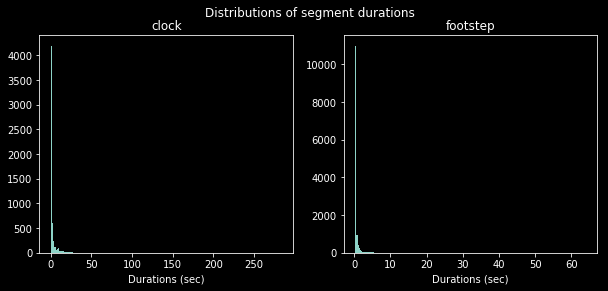

In [320]:
fig, axs = plt.subplots(1,2)
for n, c in enumerate(['clock', 'footstep']):
    _=axs[n].hist(df_segment.loc[df_segment['clusterName']==c, 'duration'], bins=200)
    axs[n].set_title(c)
    axs[n].set_xlabel('Durations (sec)')
fig.set_size_inches(10, 4)
_ = fig.suptitle('Distributions of segment durations')

### Distributions of segment onsets

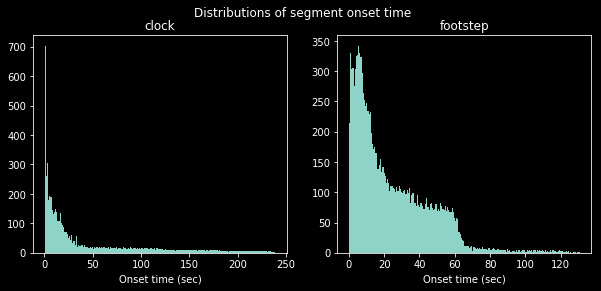

In [321]:
fig, axs = plt.subplots(1,2)
for n, c in enumerate(['clock', 'footstep']):
    _=axs[n].hist(df_segment.loc[df_segment['clusterName']==c, 'start_time'], bins=200)
    axs[n].set_title(c)
    axs[n].set_xlabel('Onset time (sec)')
fig.set_size_inches(10, 4)
_ = fig.suptitle('Distributions of segment onset time')

### Coefficient of Variation of Durations

Plotting the distirbution of coefficient of variation of the duration would help to determine if the segmented epochs are indeed repeated sounds.

In [11]:
def cv(X, axis=0, toarray=False, printerr=True, *args, **kwargs):
    try:
        if toarray:
            X = np.array(X)
        return np.nanstd(X, axis=axis, *args, **kwargs) / np.nanmean(X, axis=axis, *args, **kwargs)
    except Exception as err:
        if printerr:
            print(err)
            
        return np.array(X)[0] if len(X)>0 else np.nan

gp = df_segment.loc[:, ['location', 'start_time', 'duration', 'clusterName']].groupby(
    by=['location', 'clusterName'], sort=False, as_index=False)
Summary = gp.agg(cv)

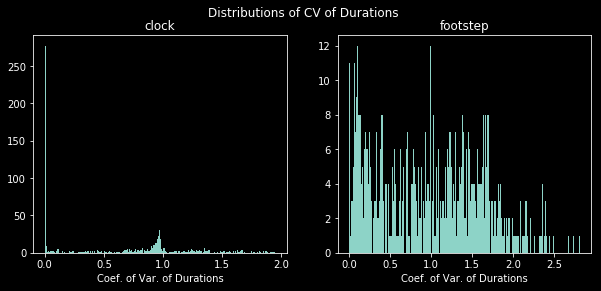

In [322]:
fig, axs = plt.subplots(1,2)
for n, c in enumerate(['clock', 'footstep']):
    _=axs[n].hist(Summary.loc[Summary['clusterName']==c, 'duration'], bins=200)
    axs[n].set_title(c)
    axs[n].set_xlabel('Coef. of Var. of Durations')
fig.set_size_inches(10, 4)
_ = fig.suptitle('Distributions of CV of Durations')

**Conclusion:** most of the clock sounds are higly repeated. In contrast, footstep sound epochs have irregular patterns. Different training strategy may be necessary for the two classes of sounds.

# Frequency distibution

## Spectral Density

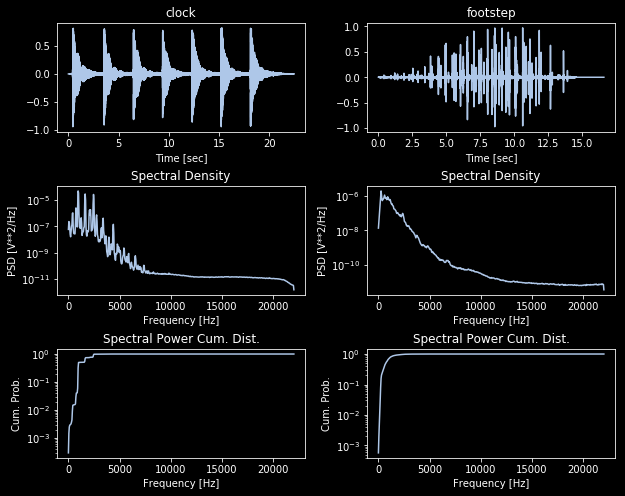

In [53]:
import librosa
import audioread

def make_spectral_power(wav_files, labels=['clock', 'footstep'], sr=44100):
    fig, ax = plt.subplots(3, 2)
    for i, wav in enumerate(wav_files):
        current_path = "./wav/{}".format(wav)
        tmp = audioread.audio_open(current_path) # ge tthe sample rate
        data_out, _ = librosa.load(current_path, sr=tmp.samplerate, dtype=np.float32)
        
        c = (174/255, 199/255, 232/255)
        ax[0,i].plot(np.linspace(0, len(data_out)/sr,len(data_out)), data_out, c=c)
        ax[0,i].set_title(labels[i])
        ax[0,i].set_xlabel('Time [sec]')
        
        f, Pxx_den = signal.welch(data_out, sr, nperseg=1024)

        ax[1,i].semilogy(f, Pxx_den, c=c)
        ax[1,i].set_title('Spectral Density')
        ax[1,i].set_xlabel('Frequency [Hz]')
        ax[1,i].set_ylabel('PSD [V**2/Hz]')
        
        Pxx_cum = Pxx_den.cumsum() / Pxx_den.sum()
        ax[2,i].semilogy(f, Pxx_cum, c=c)
        ax[2,i].set_title('Spectral Power Cum. Dist.')
        ax[2,i].set_xlabel('Frequency [Hz]')
        ax[2,i].set_ylabel('Cum. Prob.')

    fig.subplots_adjust(wspace=0.25, hspace=0.5)
    fig.set_size_inches(10,8)
    return fig
    
clock = '07016099.wav'
footstep = '07004099.wav'

fig = make_spectral_power([clock, footstep])
fig.savefig('./Example_audio_spectral_density.png')

## Distributions Power density

Up to what frequency covers 90%, 95%, or 99% of the power density?

In [63]:
df = pd.read_csv('./clock_footstep_sorted.csv')
num_data = df.shape[0]
df['FrequencyCutoff'] = np.nan

Pxx_mat = [[]] * df.shape[0]

printProgressBar(0,num_data,prefix='Progress:',suffix='Complete',length=50,mode="counts")
for i in df.index:
    printProgressBar(i+1,num_data,prefix='Progress:',suffix='Complete',length=50,mode="counts")
    current_path = "./wav/{}".format(df.loc[i, 'location'])
    tmp = audioread.audio_open(current_path) # ge tthe sample rate
    sr = tmp.samplerate
    data_out, _ = librosa.load(current_path, sr=sr, dtype=np.float32)
    f, Pxx_den = signal.welch(data_out, sr, nperseg=1024)
    Pxx_cum = Pxx_den.cumsum() / Pxx_den.sum()
    df.loc[i, 'FrequencyCutoff'] = f[np.where(Pxx_cum>0.99)[0][0]]
    Pxx_mat[i] = Pxx_den

Pxx_mat = np.array(Pxx_mat)
np.savez_compressed('./Spectral_Power_Density.npz', Pxx_mat=Pxx_mat, f=f)

Progress:  |██████████████████████████████████████████████████| 1309 / 1309 Complete
ended


In [67]:
Pxx_cum_mat = np.cumsum(Pxx_mat, axis=1) / np.sum(Pxx_mat, axis=1, keepdims=True)
df['FrequencyCutoff90'] = [f[p > 0.90][0] for p in Pxx_cum_mat]
df['FrequencyCutoff95'] = [f[p > 0.95][0] for p in Pxx_cum_mat]
df['FrequencyCutoff99'] = [f[p > 0.99][0] for p in Pxx_cum_mat]

df.loc[:, ['FrequencyCutoff90', 'FrequencyCutoff95', 'FrequencyCutoff99']].describe(\
                        percentiles=[0.5, 0.8, 0.9, 0.95, 0.99])
df.to_csv('./clock_footstep_frequency.csv', index=False)
display.display(df.loc[:, ['FrequencyCutoff90', 'FrequencyCutoff95', 'FrequencyCutoff99']].describe(\
                        percentiles=[0.5, 0.8, 0.9, 0.95, 0.99]))

,FrequencyCutoff90,FrequencyCutoff95,FrequencyCutoff99
count,1309.000000,1309.000000,1309.000000
mean,2649.916444,3302.689986,4930.593562
std,2085.076382,2320.056078,2897.710985
min,301.464844,387.597656,904.394531
50%,1894.921875,2540.917969,4048.242188
80%,3419.472656,4366.933594,6692.519531
90%,5624.472656,6468.574219,9052.558594
95%,8225.683594,8863.066406,11240.332031
99%,10074.093750,11193.820313,14618.460938
max,14039.648438,14384.179688,17872.558594


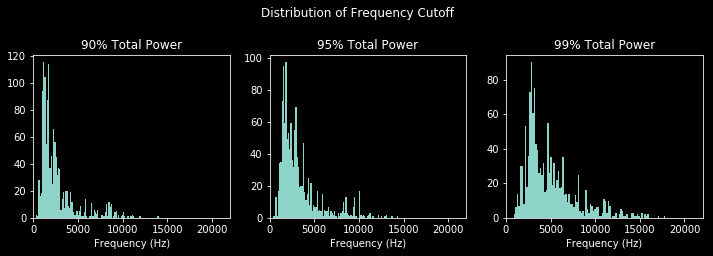

In [82]:
fig, ax = plt.subplots(1,3)
titles = ['90% Total Power', '95% Total Power', '99% Total Power']
for i, k in enumerate(['FrequencyCutoff90', 'FrequencyCutoff95', 'FrequencyCutoff99']):
    ax[i].hist(df[k], bins=100)
    ax[i].set_xlabel('Frequency (Hz)')
    ax[i].set_xlim(0, 22050)
    ax[i].set_title(titles[i])
    
fig.set_size_inches(12, 3)
_ = fig.suptitle('Distribution of Frequency Cutoff', y=1.1)

In [104]:
df.loc[df['clusterName']=='clock','secs'].sum()/60/60

6.890833333333333

# Deep Generative Neural Network

## Preparing data

In [120]:
# Separate data into folders using hardlinks
for i in df.index:
    if sys.platform[:3] == 'dar':
        cmd = 'ln ./wav/{0} ./wav/train_{1}/{0}'.format(df.loc[i, 'location'], '{}')
    else:
        cmd = 'mklink /H ./wav/{0} ./wav/train_{1}/{0}'.format(df.loc[i, 'location'], '{}')
        
    cmd = cmd.format(df.loc[i, 'clusterName'])
    os.system(cmd)

## Slice clock data

In [365]:
import librosa
import audioread

def ts_window(y, ts, window):
    index = [int(k) for k in np.array(window) / ts]
    return y[index[0]:index[1]]

def ts_pad(y, fs, dur=4.0, pad_start=0.05):
    pad_dur = dur - (len(y)/fs) # total durations need to be padded
    if pad_dur <=pad_start: # pad only beginning
        y = np.concatenate((np.zeros(int(dur*fs)-len(y)), y))
    else: # pad beginning for pad_start, then pad the end as well
        y = np.concatenate((np.zeros(int(pad_start*fs)), y))
        y = np.concatenate((y, np.zeros(int(dur*fs)-len(y))))
        
    return y

def slice_audio(audio_file, start_time, end_time, fs_out=16000, max_duration=4.0, enforce_duration=None,
               merge_epochs=False, pad_start=0.05, merged_overlap=1):
    """
    audio_file: path to audio file
    start_time, end_time: list of start and end time of the epoch
    fs_out: sampling rate of the output
    max_duration: maximum duration of the segment.
    enforce_duration: if less than the enforced duration, padding the end with zero
    merg_epochs: if merge epochs, multiple epochs are going to be combined to form a segment 
                 less than max_duration
    pad_start: pad some zeros at the beginning
    merged_overlap: number of epochs to overlap between segments made of merged epochs
    """
    tmp = audioread.audio_open(audio_file) # get the sample rate
    sr = tmp.samplerate
    data_out, _ = librosa.load(audio_file, sr=sr, dtype=np.float32)
    data_out = librosa.resample(data_out, sr, fs_out)
    Y_list = []
    if not merge_epochs: # each epoch is one segment
        for n, (st, et) in enumerate(zip(start_time, end_time)): # iterate over epochs
            dur = et - st
            if max_duration < dur:
                continue # ignore this epoch. 
                # Cannot simply take the subset, as it will be an incomplete sample
            y = ts_window(data_out, 1./fs_out, [st, et])
            Y_list.append(y)
    else: # start from the beginning of the epochs
        times = np.c_[start_time, end_time]
        niter = len(times)-1
        for i in range(niter):
            try:
                index_i, index_j = np.array(np.where(times - times[0,0] < max_duration))[:,-1]
            except:
                return []
            if index_i==0 and index_j==0: # the duration of the starting epoch is already larger than max_duration
                times = times[1:, :] # start from the next time point
            else: 
                window = [times[0, 0], times[index_i, index_j]]
                #print(window)
                y = ts_window(data_out, 1./fs_out, window)
                Y_list.append(y)
                # next
                next_index_i = max(1, index_i-merged_overlap)
                if next_index_i > times.shape[0]-1:
                    break
                times = times[next_index_i:, :] # go to next time point
                    
    if enforce_duration is not None:
        for n in range(len(Y_list)):
            Y_list[n] = ts_pad(Y_list[n], fs_out, enforce_duration, pad_start)
            
    # Enforce data type
    Y_list = [y.astype(np.float32) for y in Y_list]
            
    return Y_list 

In [366]:
df_segment = pd.read_csv('./clock_footstep_segmented.csv')
df = pd.read_csv('./clock_footstep_sorted.csv')
df = df.merge(df_segment, on='location')
locations = df['location'].unique()
num_data=len(locations)

printProgressBar(0,num_data,prefix='Progress:',suffix='Complete',length=50,mode="counts")
for i, loc in enumerate(locations):
    #if i == 0: 
    #    time.sleep(0.001)
     #   continue
    printProgressBar(i,num_data,prefix='Progress:',suffix='Complete',length=50,mode="counts")
    df_sub = df.loc[df['location']==loc, :]
    if df_sub['clusterName'].iloc[0] != 'clock':
        continue
    start_time = df_sub['start_time']
    end_time = df_sub['end_time']
    Y = slice_audio("./wav/{}".format(loc), start_time, end_time, fs_out=16000, 
                    merge_epochs=True, max_duration=4.0, enforce_duration=4.0)
    for kk, y in enumerate(Y):
        librosa.output.write_wav("./train_clock_segmented2/{}-{:d}.wav".format(
            loc.replace(".wav",""), kk), y, 16000, norm=False)
        

In [286]:
df_segment = pd.read_csv('./clock_footstep_segmented.csv')
df = pd.read_csv('./clock_footstep_sorted.csv')
df = df.merge(df_segment, on='location')
loc = '07016124.wav'
df_sub = df.loc[df['location']==loc, :]
start_time = df_sub['start_time']
end_time = df_sub['end_time']
Y = slice_audio("./wav/{}".format(loc), start_time, end_time, fs_out=16000, 
                merge_epochs=True, max_duration=4.0, enforce_duration=4.0)
display.Audio(filename="./wav/{}".format(loc))

## Run the vanilla WaveGAN

In [125]:
!export CUDA_VISIBLE_DEVICES="0"
!python ./library/wavegan/train_wavegan.py train ./train --data_dir ./wav/train_clock

# Generate samples

In [370]:
import tensorflow as tf
from IPython.display import display, Audio

# Load the graph
tf.reset_default_graph()
saver = tf.train.import_meta_graph('./train/infer/infer.meta')
graph = tf.get_default_graph()
sess = tf.InteractiveSession()
saver.restore(sess, './train/model.ckpt-7809')

INFO:tensorflow:Restoring parameters from ./train/model.ckpt-7809


### "The chimes"

In [402]:
for i, j in zip([161, 45, 59, 99], ['C','E','D','G']):
    np.random.seed(i)
    # Create 50 random latent vectors z
    _z = (np.random.rand(50, 100) * 2.) - 1

    # Synthesize G(z)
    z = graph.get_tensor_by_name('z:0')
    G_z = graph.get_tensor_by_name('G_z:0')
    _G_z = sess.run(G_z, {z: _z})

    # Play audio in notebook
    print(i, ':', j)
    display(Audio(_G_z[0, :, 0], rate=16000))

161 : C


45 : E


59 : D


99 : G
